In [84]:
import polars as pl
import plotly.express as px
import plotly.graph_objects as go
from plotly.subplots import make_subplots
from datetime import date
path = "/home/jovyan/work/data/bronze/Polars/"

In [2]:
!ls $path

complete_fraud_data.parquet


In [18]:
location_fraud_unbiased_df = (
    pl.scan_parquet(f"{path}complete_fraud_data.parquet")
    .with_columns(day = pl.col("date").cast(pl.Date))
    .filter(
        # ((pl.col("day").is_between(date(2010, 1, 1), date(2011, 1, 8))) |
        #  (pl.col("day").is_between(date(2013, 7, 19), date(2014, 4, 8))) |
        #  (pl.col("day").is_between(date(2015, 3, 30), date(2016, 12, 22)))
        # ) &
        # (pl.col("day") != date(2016, 2, 29)) &
        (pl.col("target").is_not_null())
    )
    .with_columns(
        target = pl.when(pl.col("target")).then(pl.lit("Fraudulent")).otherwise(pl.lit("Legitimate")),
        merchant_state = pl.col("merchant_state").fill_null("No_Country")
    )    
    .select("merchant_city", "merchant_state", "zip", 
            "merchant_latitude", "merchant_longitude",
            "client_latitude", "client_longitude",
            "amount", "use_chip", "day", "target", "client_id")
)


Rows = location_fraud_unbiased_df.select(pl.len()).collect().item()
Columns = len(location_fraud_unbiased_df.collect_schema().names())

print(f"Rows: {Rows}, Columns: {Columns}")
location_fraud_unbiased_df.show(5)

Rows: 8914963, Columns: 12


merchant_city,merchant_state,zip,merchant_latitude,merchant_longitude,client_latitude,client_longitude,amount,use_chip,day,target,client_id
str,str,str,f64,f64,f64,f64,f64,cat,date,str,str
"""Arcadia""","""CA""","""91007""",34.1243,-118.0515,32.61,-117.03,10.64,"""Swipe Transaction""",2010-01-01,"""Legitimate""","""822"""
"""Houston""","""TX""","""77052""",29.7633,-95.3633,40.6,-74.76,6.71,"""Swipe Transaction""",2010-01-01,"""Legitimate""","""1147"""
"""Clinton""","""TN""","""37716""",36.0869,-84.1897,36.09,-84.13,-90.0,"""Swipe Transaction""",2010-01-01,"""Legitimate""","""1541"""
"""Bristol""","""NH""","""03222""",43.612,-71.7507,43.6,-71.74,8.6,"""Swipe Transaction""",2010-01-01,"""Legitimate""","""148"""
"""Thackerville""","""OK""","""73459""",33.7882,-97.1363,42.68,-89.01,72.85,"""Swipe Transaction""",2010-01-01,"""Legitimate""","""1248"""


In [19]:
n_states = location_fraud_unbiased_df.select(pl.col('merchant_state').n_unique()).collect().item()
print(f"Number of states: {n_states}")

Number of states: 200


In [23]:
USA_states = [
    "CA", "NY", "TX", "FL", "ID", "CT", "IL", "PA", "OH", "GA", 
    "MI", "NC", "NJ", "VA", "WA", "AZ", "AK", "AL", "AR", "CO", 
    "DE", "HI", "IA", "IN", "KS", "KY", "LA", "MA", "MD", "ME", 
    "MN", "MO", "MS", "MT", "ND", "NE", "NH", "NM", "NV", "OK", 
    "OR", "RI", "SC", "SD", "TN", "UT", "VT", "WI", "WV", "WY",
    "DC"
]

location_fraud_unbiased_df = (
    location_fraud_unbiased_df
    .with_columns(
        merchant_country = pl.when(pl.col("merchant_state").is_in(USA_states))
                             .then(pl.lit("USA")).otherwise(pl.col("merchant_state"))
    )
)

location_fraud_unbiased_df.show(5)

merchant_city,merchant_state,zip,merchant_latitude,merchant_longitude,client_latitude,client_longitude,amount,use_chip,day,target,client_id,merchant_country
str,str,str,f64,f64,f64,f64,f64,cat,date,str,str,str
"""Arcadia""","""CA""","""91007""",34.1243,-118.0515,32.61,-117.03,10.64,"""Swipe Transaction""",2010-01-01,"""Legitimate""","""822""","""USA"""
"""Houston""","""TX""","""77052""",29.7633,-95.3633,40.6,-74.76,6.71,"""Swipe Transaction""",2010-01-01,"""Legitimate""","""1147""","""USA"""
"""Clinton""","""TN""","""37716""",36.0869,-84.1897,36.09,-84.13,-90.0,"""Swipe Transaction""",2010-01-01,"""Legitimate""","""1541""","""USA"""
"""Bristol""","""NH""","""03222""",43.612,-71.7507,43.6,-71.74,8.6,"""Swipe Transaction""",2010-01-01,"""Legitimate""","""148""","""USA"""
"""Thackerville""","""OK""","""73459""",33.7882,-97.1363,42.68,-89.01,72.85,"""Swipe Transaction""",2010-01-01,"""Legitimate""","""1248""","""USA"""


In [24]:
n_countries = location_fraud_unbiased_df.select(pl.col('merchant_country').n_unique()).collect().item()
print(f"Number of countries: {n_countries}")

Number of countries: 150


In [25]:
fraudulent_countries_df = (
    location_fraud_unbiased_df
    .filter(pl.col("target") == "Fraudulent")
    .select(pl.col("merchant_country").unique())
    .collect() 
)

fraudulent_countries_list = fraudulent_countries_df["merchant_country"].to_list()
fraudulent_countries_list

['Haiti', 'Tuvalu', 'USA', 'Italy', 'No_Country']

In [31]:
iso_country = {
    "Haiti": "HTI",
    "Tuvalu": "TUV",
    "Italy": "ITA",
    "USA": "USA" 
}

rate_country_fraud_unbiased_df = (
    location_fraud_unbiased_df
    .filter(
        pl.col("merchant_country").is_in(fraudulent_countries_list) &
        (pl.col("merchant_country") != "No_Country")
    )
    .group_by("merchant_country", "target")
    .agg(Total = pl.col("target").len())
    .with_columns(
        fraud_rate = (pl.col("Total") / pl.col("Total").sum().over("target") * 100).round(2),
        merchant_country = pl.col("merchant_country").replace(iso_country)
    )
    .sort("Total", descending=True)
    .collect()
)

rate_country_fraud_unbiased_df.show(10)

merchant_country,target,Total,fraud_rate
str,str,u32,f64
"""USA""","""Legitimate""",7806349,99.98
"""ITA""","""Fraudulent""",3061,67.23
"""ITA""","""Legitimate""",1645,0.02
"""USA""","""Fraudulent""",1234,27.1
"""HTI""","""Fraudulent""",253,5.56
"""HTI""","""Legitimate""",11,0.0
"""TUV""","""Fraudulent""",5,0.11


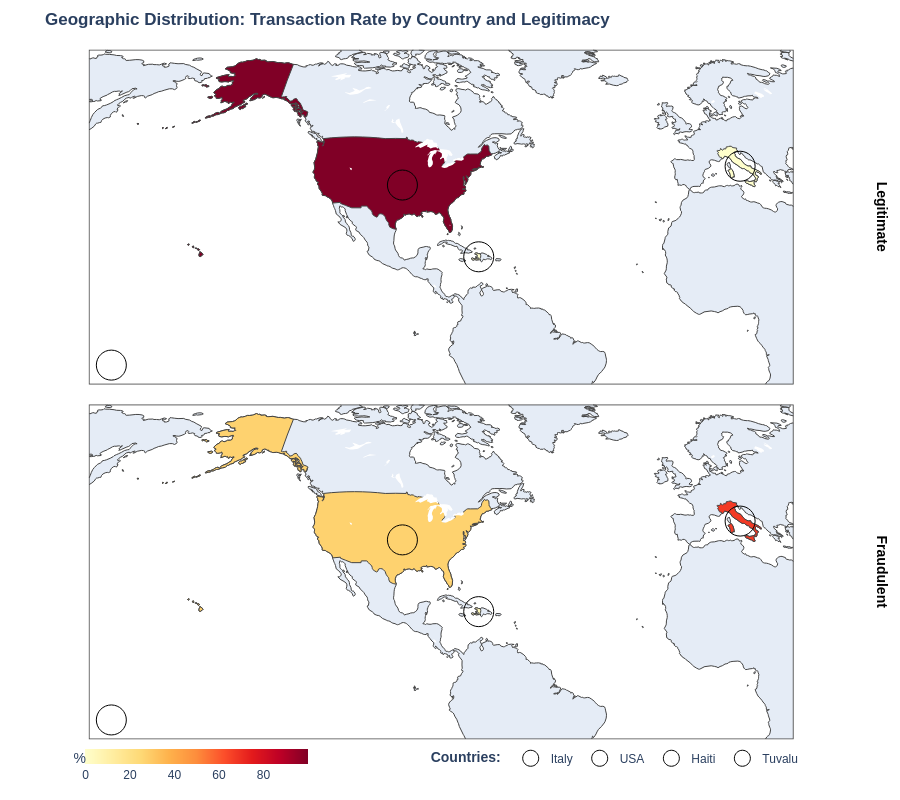

In [33]:
min_tasa = rate_country_fraud_unbiased_df['fraud_rate'].min()
max_tasa = rate_country_fraud_unbiased_df['fraud_rate'].max()

rate_country_fraud_unbiased_map = px.choropleth(
    rate_country_fraud_unbiased_df,
    locations="merchant_country", 
    locationmode="ISO-3",   
    color="fraud_rate",
    facet_row="target",
    scope="world",                 
    color_continuous_scale="YlOrRd", 
    range_color=[min_tasa, max_tasa],
    title="<b>Geographic Distribution: Transaction Rate by Country and Legitimacy</b>",
    labels={"fraud_rate": "Transactions(%)", "merchant_country": "País"}
)


rate_country_fraud_unbiased_map.update_geos(
    projection_type="natural earth",
    lakecolor="white", showlakes=True,
    lataxis_range=[-13, 71],   
    lonaxis_range=[-187, 20]  
)

coords = {
    'Italy': {'lat': 41.87, 'lon': 12.56},
    'USA': {'lat': 37.09, 'lon': -95.71},
    'Haiti': {'lat': 18.97, 'lon': -72.28},
    'Tuvalu': {'lat': -8.52, 'lon': 179.21} 
}

for pais, pos in coords.items():
    rate_country_fraud_unbiased_map.add_trace(
        go.Scattergeo(
            lat=[pos['lat']], lon=[pos['lon']],
            name=pais,
            mode='markers',
            marker=dict(size=30, color='black', symbol='circle-open', opacity=1),
            showlegend=True,
            hoverinfo="skip",
            geo="geo" 
        )
    )
    rate_country_fraud_unbiased_map.add_trace(
        go.Scattergeo(
            lat=[pos['lat']], lon=[pos['lon']],
            name=pais,
            mode='markers',
            marker=dict(size=30, color='black', symbol='circle-open', opacity=1),
            showlegend=False,
            hoverinfo="skip",
            geo="geo2" 
        )
    )

rate_country_fraud_unbiased_map.update_layout(
    title_x=0.05,                
    width=900, height=800, autosize=False,                 
    margin=dict(l=10, r=10, t=50, b=50),    
    coloraxis_colorbar=dict(
        title="%",
        orientation="h", thickness=15, len=0.3,       
        xanchor="center", x=0.2,
        yanchor="top",  y= -0.
    ),
    legend=dict(
        orientation="h", 
        yanchor="bottom", y=-0.049,          
        xanchor="center", x=0.69, 
        title_text="<b>Countries:</b>"
    )
)

rate_country_fraud_unbiased_map.for_each_annotation(lambda a: a.update(
    text=f"<b>{a.text.split('=')[-1]}</b>",
    font=dict(size=14, color="black")
    )
)

rate_country_fraud_unbiased_map.show()

In [34]:
chip_color = {
    'Online Transaction': '#7EA1B5', 
    'Swipe Transaction': '#F2A183', 
    'Chip Transaction': '#89D3C2'
}

In [39]:
number_country_fraud_unbiased_df = (
    location_fraud_unbiased_df
    .filter(pl.col("merchant_country").is_in(fraudulent_countries_list))
    .group_by("merchant_country", "target", "use_chip")
    .agg(Total = pl.col("target").len())
    .sort("Total", descending=True)
    .collect()
)

number_country_fraud_unbiased_df.show(5)

merchant_country,target,use_chip,Total
str,str,cat,u32
"""USA""","""Legitimate""","""Swipe Transaction""",4634888
"""USA""","""Legitimate""","""Chip Transaction""",3171461
"""No_Country""","""Legitimate""","""Online Transaction""",1035196
"""No_Country""","""Fraudulent""","""Online Transaction""",8779
"""No_Country""","""Legitimate""","""Chip Transaction""",3890


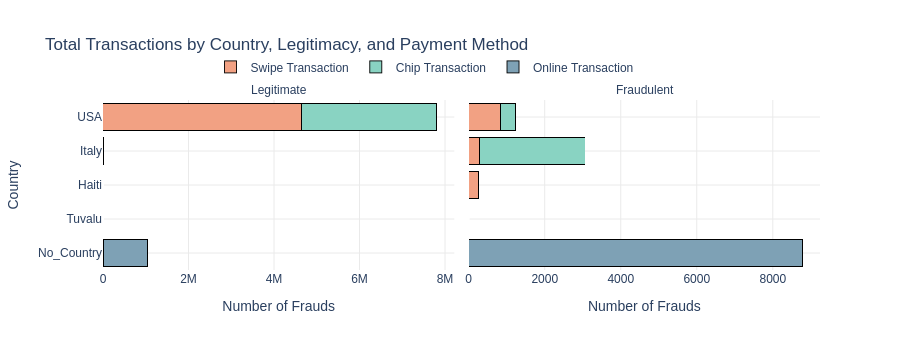

In [42]:
number_country_fraud_unbiased_fig = px.bar(
    number_country_fraud_unbiased_df,
    x="Total",
    y="merchant_country",
    color="use_chip",
    facet_col= "target",
    orientation="h",
    barmode="stack",
    title="Total Transactions by Country, Legitimacy, and Payment Method",
    color_discrete_map= chip_color,
        labels={"Total": "Number of Frauds", "merchant_country": "Country", 
            "use_chip": "Payment Method"}
)

number_country_fraud_unbiased_fig.update_traces(
    marker_line_color='black', marker_line_width=0.9
)

number_country_fraud_unbiased_fig.update_xaxes(matches=None, showgrid=True, gridcolor="#EAEAEA")
number_country_fraud_unbiased_fig.update_yaxes(autorange="reversed", showgrid=True, gridcolor="#EAEAEA")

number_country_fraud_unbiased_fig.update_layout(
    plot_bgcolor="white", paper_bgcolor="white",
    width=900, height=350, autosize=False,
    legend=dict(title="", orientation="h", yanchor="top", y=1.28, xanchor="left", x=0.15)
)

number_country_fraud_unbiased_fig.for_each_annotation(lambda a: a.update(text=a.text.split('=')[-1]))

number_country_fraud_unbiased_fig.show()

In [44]:
amount_country_fraud_unbiased_df = (
    location_fraud_unbiased_df
    .filter(pl.col("merchant_country").is_in(fraudulent_countries_list))
    .group_by("merchant_country", "target", "use_chip")
    .agg(Total = pl.col("amount").sum())
    .sort("Total", descending=True)
    .collect()
)

amount_country_fraud_unbiased_df.show(5)

merchant_country,target,use_chip,Total
str,str,cat,f64
"""USA""","""Legitimate""","""Swipe Transaction""",1.9111e8
"""USA""","""Legitimate""","""Chip Transaction""",1.2990e8
"""No_Country""","""Legitimate""","""Online Transaction""",5.8667e7
"""No_Country""","""Fraudulent""","""Online Transaction""",1.0616e6
"""Italy""","""Fraudulent""","""Chip Transaction""",238236.91


En la lista del volumen de dinero de transaccciones por chip, observamos que aquellos sitios donde no hay un registro del pais la suma es negativa (en la anterior tabla observamos que este subconjunto representa un total de 3890 operaciones), deducimos que esto es por alguna particularidad de la naturaleza de algunos reembolsos por chip o por algún error o sesgo del dataset. Dado que este número es ínfimo en comparación al resto de transacciones legítimas sin país atribuido, continuaremos con la forma de representar los gráficos, y evitaremos el uso de gráficos de divergencia

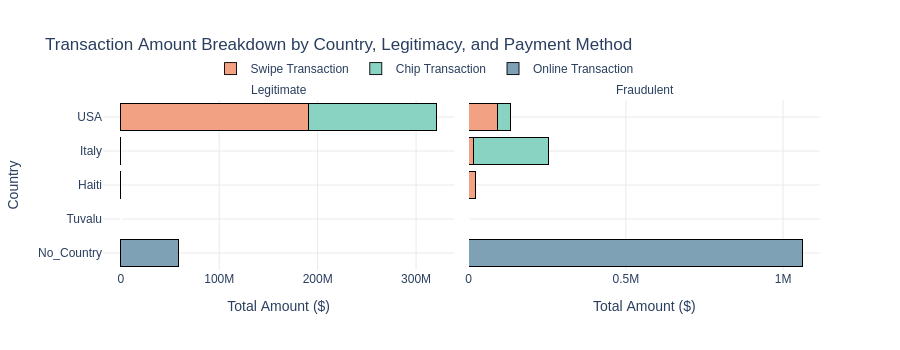

In [47]:
amount_country_fraud_unbiased_fig = px.bar(
    amount_country_fraud_unbiased_df,
    x="Total",
    y="merchant_country",
    color="use_chip",
    facet_col = "target",
    orientation="h",
    barmode="stack",
    title="Transaction Amount Breakdown by Country, Legitimacy, and Payment Method",
    color_discrete_map= chip_color,
    labels={"Total": "Amount", "merchant_country": "Country", 
            "use_chip": "Payment Method"}
)

amount_country_fraud_unbiased_fig.update_traces(
    marker_line_color='black', marker_line_width=0.9
)

amount_country_fraud_unbiased_fig.update_xaxes(matches=None, showgrid=True, gridcolor="#EAEAEA",
                                              title="Total Amount ($)")
amount_country_fraud_unbiased_fig.update_yaxes(autorange="reversed", showgrid=True, gridcolor="#EAEAEA")

amount_country_fraud_unbiased_fig.update_layout(
    plot_bgcolor="white", paper_bgcolor="white",
    width=900, height=350, autosize=False,
    legend=dict(title="", orientation="h", yanchor="top", y=1.27, xanchor="left", x=0.15)
)

amount_country_fraud_unbiased_fig.for_each_annotation(lambda a: a.update(text=a.text.split('=')[-1]))

amount_country_fraud_unbiased_fig.show()

In [50]:
count_year_fraud_df = (
    location_fraud_unbiased_df
    .filter((pl.col("target") == 'Fraudulent'))
    .select("merchant_country", "day")
    .group_by("day", "merchant_country")
    .len()
    .collect()
)

count_year_fraud_df.show(5)

day,merchant_country,len
date,str,u32
2016-02-16,"""No_Country""",23
2010-01-13,"""Tuvalu""",1
2010-01-27,"""No_Country""",1
2010-02-12,"""No_Country""",17
2010-01-09,"""No_Country""",1


In [53]:
country_color = {
    'USA': '#636EFA', 
    'Italy': '#FFA15A', 
    'Haiti': '#EF553B',
    'Tuvalu': '#AB63FA', 
    'No_Country': '#00CC96'    
}
country_order= ['Italy', 'No_Country', 'USA', 'Haiti', 'Tuvalu']

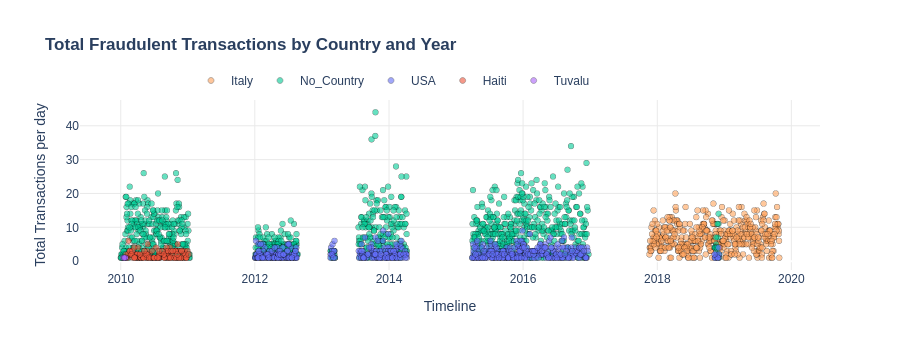

In [58]:
count_year_fraud_fig = px.scatter(
    count_year_fraud_df,
    x="day",        
    y="len",    
    color="merchant_country", 
    opacity=0.6,
    category_orders={"merchant_country": country_order},
    color_discrete_map= country_color,
    title="<b>Total Fraudulent Transactions by Country and Year</b>",
    labels={"day": "Timeline", "len": "Total Transactions per day",
            "merchant_country": ""}
)

count_year_fraud_fig.update_traces(
    marker=dict(line=dict(color='black', width=0.45)))

count_year_fraud_fig.update_layout(
    plot_bgcolor="white", paper_bgcolor="white",
    width=900, height=350, autosize=False,
    xaxis=dict(showgrid=True, gridcolor="#EAEAEA"),
    yaxis=dict(showgrid=True, gridcolor="#EAEAEA"),
    legend=dict(title="", orientation="h", yanchor="top", y=1.2, xanchor="left", x=0.15)
)

count_year_fraud_fig.show()


In [62]:
USA_year_fraud_df = (
    location_fraud_unbiased_df
    .filter(pl.col("merchant_country") == 'USA')
    .select("merchant_country", "target", "day")
    .with_columns(year = pl.col("day").dt.year())
    .group_by("year", "merchant_country", "target")
    .len() 
    .sort("year", descending = True)
)

USA_year_fraud_df.show(20)

year,merchant_country,target,len
i32,str,str,u32
2019,"""USA""","""Legitimate""",676175
2018,"""USA""","""Fraudulent""",15
2018,"""USA""","""Legitimate""",813972
2017,"""USA""","""Legitimate""",817215
2016,"""USA""","""Legitimate""",811744
2016,"""USA""","""Fraudulent""",352
2015,"""USA""","""Fraudulent""",325
2015,"""USA""","""Legitimate""",809235
2014,"""USA""","""Fraudulent""",102


In [65]:
amount_year_fraud_df = (
    location_fraud_unbiased_df
    .filter(pl.col("target") == 'Fraudulent')
    .select("merchant_country", "amount", "day")
    .group_by("day", "merchant_country")
    .agg(Total = pl.col("amount").sum())
    .collect()
)

amount_year_fraud_df.show(5)

day,merchant_country,Total
date,str,f64
2012-06-26,"""USA""",304.7
2013-10-18,"""USA""",64.94
2010-01-22,"""Tuvalu""",35.48
2010-01-11,"""No_Country""",302.7
2010-01-31,"""Haiti""",130.63


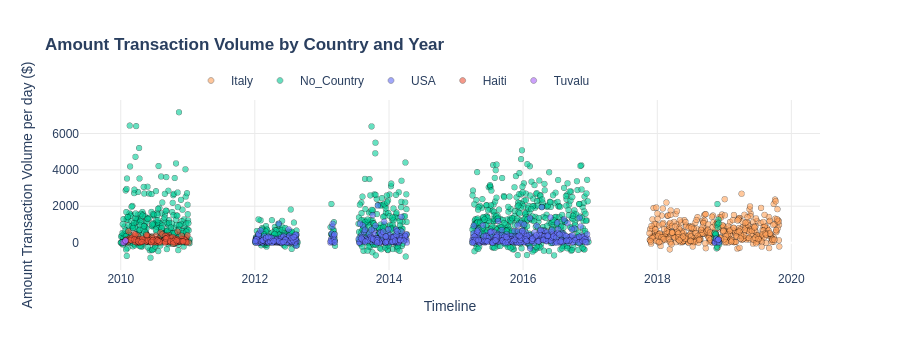

In [68]:
amount_year_fraud_fig = px.scatter(
    amount_year_fraud_df,
    x="day",        
    y="Total",    
    color="merchant_country", 
    opacity=0.6,
    category_orders={"merchant_country": country_order},
    color_discrete_map= country_color,
    title="<b>Amount Transaction Volume by Country and Year</b>",
    labels={"day": "Timeline", "Total": "Amount Transaction Volume per day ($)", "merchant_country": "Country"}
)

amount_year_fraud_fig.update_traces(
    marker=dict(line=dict(color='black', width=0.45)))

amount_year_fraud_fig.update_layout(
    plot_bgcolor="white", paper_bgcolor="white",
    width=900, height=350, autosize=False,
    xaxis=dict(showgrid=True, gridcolor="#EAEAEA"),
    yaxis=dict(showgrid=True, gridcolor="#EAEAEA"),
    legend=dict(title="", orientation="h", yanchor="top", y=1.2, xanchor="left", x=0.15)
)

amount_year_fraud_fig.show()

In [69]:
No_USA_fraud_countries_df = (
    location_fraud_unbiased_df
    .filter(pl.col("merchant_country").is_in(['Italy', 'Haiti', 'Tuvalu']))
    .group_by("merchant_country", "merchant_city", "zip", "target")
    .agg(Total = pl.col("target").len())
    .with_columns(
        fraud_rate = (pl.col("Total") / pl.col("Total").sum().over("target") * 100).round(2)
    )
    .sort("fraud_rate", descending=True)
)

No_USA_fraud_countries_df.show(10)

merchant_country,merchant_city,zip,target,Total,fraud_rate
str,str,str,str,u32,f64
"""Italy""","""Rome""",null,"""Legitimate""",1645,99.34
"""Italy""","""Rome""",null,"""Fraudulent""",3061,92.23
"""Haiti""","""Port au Prince""",null,"""Fraudulent""",253,7.62
"""Haiti""","""Port au Prince""",null,"""Legitimate""",11,0.66
"""Tuvalu""","""Funafuti""",null,"""Fraudulent""",5,0.15


In [71]:
rate_USAstates_fraud_unbiased_df = (
    location_fraud_unbiased_df
    .filter(pl.col("merchant_country") == 'USA')
    .group_by("merchant_state", "target")
    .agg(Total = pl.col("target").len())
    .with_columns(
        fraud_rate = (pl.col("Total") / pl.col("Total").sum().over("target") * 100).round(2)
    )
    .sort("fraud_rate", descending=True)
    .collect()
)

rate_USAstates_fraud_unbiased_df.show(5)

merchant_state,target,Total,fraud_rate
str,str,u32,f64
"""OH""","""Fraudulent""",316,25.61
"""CA""","""Legitimate""",956229,12.25
"""CA""","""Fraudulent""",127,10.29
"""TX""","""Legitimate""",677063,8.67
"""NY""","""Legitimate""",574463,7.36


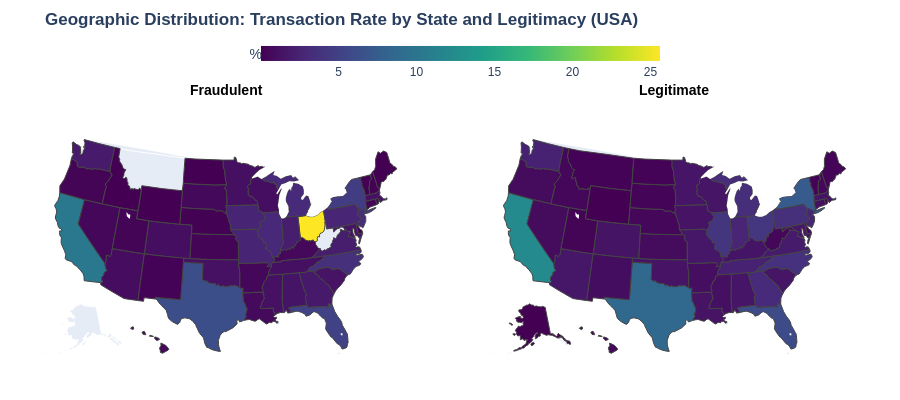

In [75]:
min_tasa = rate_USAstates_fraud_unbiased_df['fraud_rate'].min()
max_tasa = rate_USAstates_fraud_unbiased_df['fraud_rate'].max()

rate_USAstates_fraud_unbiased_map = px.choropleth(
    rate_USAstates_fraud_unbiased_df,
    locations="merchant_state",      
    locationmode="USA-states",        
    color="fraud_rate", 
    facet_col="target",
    scope="usa",                      
    color_continuous_scale="Viridis",
    range_color=[min_tasa, max_tasa],
    title="<b>Geographic Distribution: Transaction Rate by State and Legitimacy (USA)</b>",
    labels={"fraud_rate": "Fraud rate (%)", "merchant_state": "State"}
)

rate_USAstates_fraudrate_USAzip_fraud_unbiased_df = (
    location_fraud_unbiased_df
    .filter(F.col("merchant_country") == 'USA')
    .groupBy("merchant_latitude", "merchant_longitude", "target")
    .agg(F.count("target").alias("Total"))
    .withColumn(
        "fraud_rate",
        F.round((F.col("Total") / F.sum("Total").over(Window.partitionBy("target"))) * 100, 5)
    )
    .orderBy(F.col("fraud_rate").desc())
)

rate_USAzip_fraud_unbiased_df.show(10)_unbiased_map.update_layout(
    title_x=0.05,                
    width=900, height=400, autosize=False,               
    margin=dict(l=10, r=10, t=10, b=10), 
    
    coloraxis_colorbar=dict(
        title="%",
        orientation="h",  
        thickness=15, len=0.5,           
        x=0.5, xanchor="center",
        y=1.05, yanchor="bottom"
    )
)

rate_USAstates_fraud_unbiased_map.for_each_annotation(lambda a: a.update(
    text=f"<b>{a.text.split('=')[-1]}</b>",
    font=dict(size=14, color="black")
    )
)

rate_USAstates_fraud_unbiased_map.show()

In [78]:
rate_USAzip_fraud_unbiased_df = (
    location_fraud_unbiased_df
    .filter(pl.col("merchant_country") == 'USA')
    .group_by("merchant_latitude", "merchant_longitude", "target")
    .agg(Total = pl.col("target").len())
    .with_columns(
        fraud_rate = (pl.col("Total") / pl.col("Total").sum().over("target") * 100).round(2)
    )
    .sort("fraud_rate", descending=True)
    .collect()
)

rate_USAzip_fraud_unbiased_df.show(10)

merchant_latitude,merchant_longitude,target,Total,fraud_rate
f64,f64,str,u32,f64
40.6003,-81.5366,"""Fraudulent""",213,17.26
40.5148,-81.6604,"""Fraudulent""",23,1.86
43.18,-95.4817,"""Fraudulent""",8,0.65
40.6166,-83.0693,"""Fraudulent""",7,0.57
40.5876,-83.1271,"""Fraudulent""",7,0.57
40.9637,-81.4211,"""Fraudulent""",7,0.57
40.6136,-82.5175,"""Fraudulent""",6,0.49
40.8094,-81.9483,"""Fraudulent""",5,0.41
29.7023,-95.4611,"""Fraudulent""",4,0.32


In [100]:
USAzip_fraud_df = rate_USAzip_fraud_unbiased_df.filter(pl.col('target') == 'Fraudulent')
USAzip_leg_df = rate_USAzip_fraud_unbiased_df.filter(pl.col('target') == 'Legitimate')

print("Total Fraudulent Transactions in USA:", USAzip_fraud_df["Total"].sum())
print("Total Legitimate Transactions in USA:", USAzip_leg_df["Total"].sum())
print("Fraudulent Transaction Map Points:", len(USAzip_fraud_df))
print("Legitimate Transaction Map Points:", len(USAzip_leg_df))

Total Fraudulent Transactions in USA: 1234
Total Legitimate Transactions in USA: 7806349
Fraudulent Transaction Map Points: 831
Legitimate Transaction Map Points: 23920


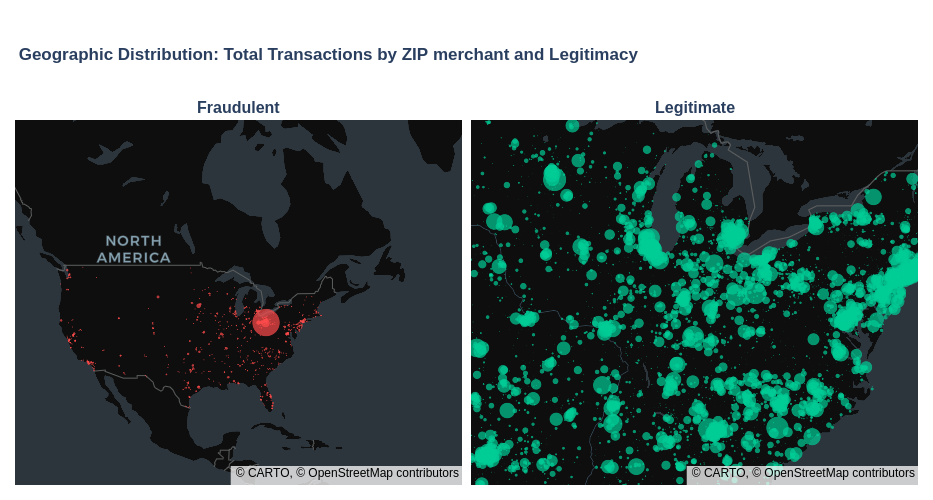

In [92]:
total_USAzip_fig_final = make_subplots(
    rows=1, cols=2,
    subplot_titles=("<b>Fraudulent</b>", "<b>Legitimate</b>"),
    specs=[[{"type": "map"}, {"type": "map"}]],
    horizontal_spacing=0.01
)

total_USAzip_fig_fraud = px.scatter_map(
    USAzip_fraud_df,
    lat="merchant_latitude",     
    lon="merchant_longitude",     
    size="Total",
    color_discrete_sequence=["#FF4B4B"]
)

total_USAzip_fig_legit = px.scatter_map(
    USAzip_leg_df,
    lat="merchant_latitude",     
    lon="merchant_longitude",     
    size="Total",
    color_discrete_sequence=["#00CC96"]
)

for trace in total_USAzip_fig_fraud.data:
    trace.name = "Fraudulent"
    total_USAzip_fig_final.add_trace(trace, row=1, col=1)

for trace in total_USAzip_fig_legit.data:
    trace.name = "Legitimate"
    total_USAzip_fig_final.add_trace(trace, row=1, col=2)

total_USAzip_fig_final.update_layout(
    title_text="<b>Geographic Distribution: Total Transactions by ZIP merchant and Legitimacy</b>",
    title_x=0.02,
    width=900, height=500, autosize=False, 
    margin={"r":15, "t":120, "l":15, "b":15},
    map1=dict(style="carto-darkmatter", center={"lat": 37.0902, "lon": -95.7129}, zoom=2.1),
    map2=dict(style="carto-darkmatter", center={"lat": 37.0902, "lon": -95.7129}, zoom=2.1)
)

total_USAzip_fig_final.show()

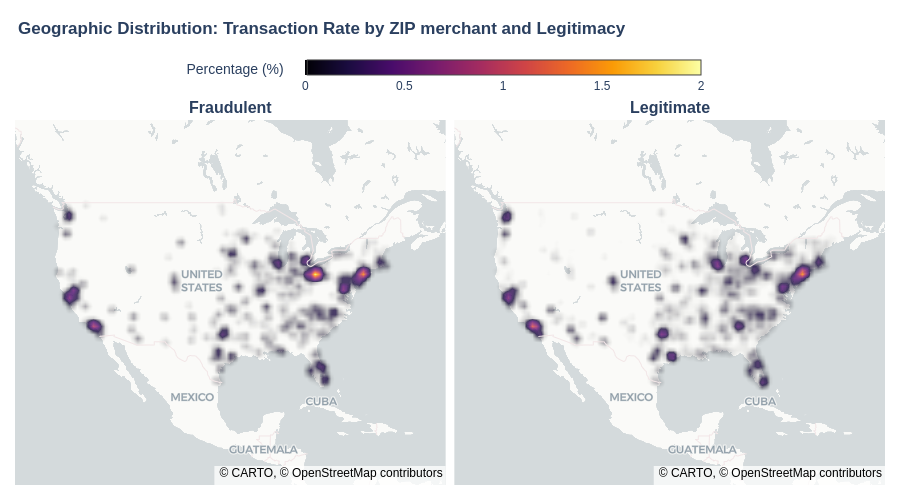

In [94]:
rate_USAzip_fig = make_subplots(
    rows=1, cols=2,
    subplot_titles=("<b>Fraudulent</b>", "<b>Legitimate</b>"),
    specs=[[{"type": "map"}, {"type": "map"}]],
    horizontal_spacing=0.01
)

rate_USAzip_fig.add_trace(
    go.Densitymap(
        lat= USAzip_fraud_df['merchant_latitude'], 
        lon= USAzip_fraud_df['merchant_longitude'], 
        z= USAzip_fraud_df['fraud_rate'],
        radius=8, opacity=0.8,
        colorscale="Inferno", showscale=True, 
        zmin=0.0, zmax=2,  
        colorbar=dict(
            title="Percentage (%)", orientation="h", 
            y=1.05, x=0.5, 
            xanchor="center",thickness=15, len=0.6
        )
    ), row=1, col=1
)

rate_USAzip_fig.add_trace(
    go.Densitymap(
        lat=USAzip_leg_df['merchant_latitude'], 
        lon=USAzip_leg_df['merchant_longitude'], 
        z=USAzip_leg_df['fraud_rate'],
        radius=8, opacity=0.8,
        colorscale="Inferno", showscale=False,
        zmin=0.0, zmax=2                 
    ), row=1, col=2
)

rate_USAzip_fig.update_layout(
    title_text="<b>Geographic Distribution: Transaction Rate by ZIP merchant and Legitimacy</b>",
    title_x=0.02,
    margin={"r":15, "t":120, "l":15, "b":15},
    height=500, width=900, autosize=False,
    map=dict(style="carto-positron", center=dict(lat=37.0902, lon=-95.7129), zoom=2.1),
    map2=dict(style="carto-positron", center=dict(lat=37.0902, lon=-95.7129), zoom=2.1)
)

rate_USAzip_fig.show()

In [97]:
client_fraud_unbiased_df = (
    location_fraud_unbiased_df
    .group_by("client_latitude", "client_longitude", "target")
    .agg(Total = pl.col("target").len())
    .with_columns(
        fraud_rate = (pl.col("Total") / pl.col("Total").sum().over("target") * 100).round(2)
    )
    .sort("fraud_rate", descending=True)
    .collect()
)

client_fraud_unbiased_df.show(5)

client_latitude,client_longitude,target,Total,fraud_rate
f64,f64,str,u32,f64
29.76,-95.38,"""Legitimate""",121585,1.37
29.76,-95.38,"""Fraudulent""",143,1.07
40.64,-73.94,"""Legitimate""",71275,0.8
25.77,-80.2,"""Legitimate""",65670,0.74
25.77,-80.2,"""Fraudulent""",96,0.72


In [99]:
client_fraud_df = client_fraud_unbiased_df.filter(pl.col('target') == 'Fraudulent')
client_leg_df = client_fraud_unbiased_df.filter(pl.col('target') == 'Legitimate')

print("Total Fraudulent Transactions:", client_fraud_df["Total"].sum())
print("Total Legitimate Transactions:", client_leg_df["Total"].sum())
print("Fraudulent Transaction Map Points:", len(client_fraud_df))
print("Legitimate Transaction Map Points:", len(client_leg_df))

Total Fraudulent Transactions: 13332
Total Legitimate Transactions: 8901631
Fraudulent Transaction Map Points: 980
Legitimate Transaction Map Points: 993


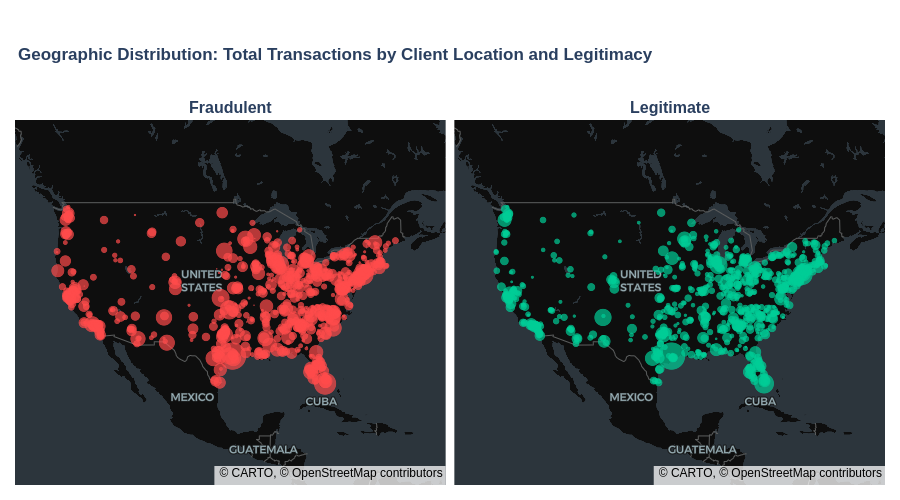

In [102]:
client_fraud_unbiased_fig = make_subplots(
    rows=1, cols=2,
    subplot_titles=("<b>Fraudulent</b>", "<b>Legitimate</b>"),
    specs=[[{"type": "map"}, {"type": "map"}]],
    horizontal_spacing=0.01
)

client_fraud_fig = px.scatter_map(
    client_fraud_df,
    lat="client_latitude",    
    lon="client_longitude", 
    size="Total",
    color_discrete_sequence=["#FF4B4B"]
)

client_leg_fig = px.scatter_map(
    client_leg_df,
    lat="client_latitude", 
    lon="client_longitude",
    size="Total",
    color_discrete_sequence=["#00CC96"]
)

for trace in client_fraud_fig.data:
    trace.name = "Fraudulent"
    client_fraud_unbiased_fig.add_trace(trace, row=1, col=1)

for trace in client_leg_fig.data:
    trace.name = "Legitimate"
    client_fraud_unbiased_fig.add_trace(trace, row=1, col=2)


client_fraud_unbiased_fig.update_layout(
    title_text="<b>Geographic Distribution: Total Transactions by Client Location and Legitimacy</b>",
    title_x=0.02,
    height=500, width=900, autosize=False,
    margin={"r":15, "t":120, "l":15, "b":15},
    map1=dict(style="carto-darkmatter", center={"lat": 37.0902, "lon": -95.7129}, zoom=2.1),
    map2=dict(style="carto-darkmatter", center={"lat": 37.0902, "lon": -95.7129}, zoom=2.1)
)

client_fraud_unbiased_fig.show()


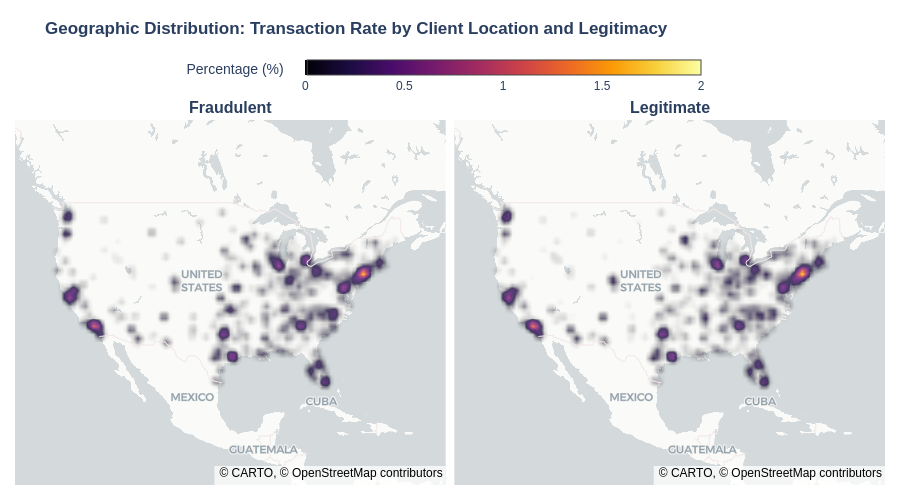

In [103]:
rate_client_fraud_unbiased_fig = make_subplots(
    rows=1, cols=2,
    subplot_titles=("<b>Fraudulent</b>", "<b>Legitimate</b>"),
    specs=[[{"type": "map"}, {"type": "map"}]],
    horizontal_spacing=0.01
)

rate_client_fraud_unbiased_fig.add_trace(
    go.Densitymap(
        lat=client_fraud_df['client_latitude'], 
        lon=client_fraud_df['client_longitude'],
        z=client_fraud_df['fraud_rate'],
        radius=8, opacity=0.8,
        colorscale="Inferno", showscale=True, 
        zmin=0.0, zmax=2,  
        colorbar=dict(
            title="Percentage (%)", orientation="h", 
            y=1.05, x=0.5, 
            xanchor="center", thickness=15, len=0.6
        )
    ), row=1, col=1
)

rate_client_fraud_unbiased_fig.add_trace(
    go.Densitymap(
        lat=client_leg_df['client_latitude'],      
        lon=client_leg_df['client_longitude'], 
        z=client_leg_df['fraud_rate'],
        radius=8, opacity=0.8,
        colorscale="Inferno", showscale=False,
        zmin=0.0, zmax=2                 
    ), row=1, col=2
)

rate_client_fraud_unbiased_fig.update_layout(
    title_text="<b>Geographic Distribution: Transaction Rate by Client Location and Legitimacy</b>",
    margin={"r":15, "t":120, "l":15, "b":15},
    height=500, width=800, autosize=False,
    map1=dict(style="carto-positron", center=dict(lat=37.0902, lon=-95.7129), zoom=2.1),
    map2=dict(style="carto-positron", center=dict(lat=37.0902, lon=-95.7129), zoom=2.1)
)

rate_client_fraud_unbiased_fig.show()

Analizamos el historial de transacciones de algunos clientes

In [105]:
fraudulent_client_df = (
    location_fraud_unbiased_df
    .select("client_id", "target")
    .filter(pl.col("target") == 'Fraudulent')
    .unique()
    .collect()
)

fraudulent_client_list = fraudulent_client_df["client_id"].to_list()
print("Total Clients with Fraudulent Transactions:", len(fraudulent_client_list))

Total Clients with Fraudulent Transactions: 1196


In [107]:
client_df = (
    location_fraud_unbiased_df
    .filter(pl.col("client_id").is_in(fraudulent_client_list))
    .select("client_id", "day", "merchant_city", "merchant_state", 
            "merchant_latitude", "merchant_longitude",
            "client_latitude", "client_longitude",
            "use_chip", "target",)
)

Rows_client = client_df.select(pl.len()).collect().item()
Columns_client = len(client_df.collect_schema().names())

print(f"Rows: {Rows_client}, Columns: {Columns_client}")
client_df.show(5)

Rows: 8766436, Columns: 10


client_id,day,merchant_city,merchant_state,merchant_latitude,merchant_longitude,client_latitude,client_longitude,use_chip,target
str,date,str,str,f64,f64,f64,f64,cat,str
"""822""",2010-01-01,"""Arcadia""","""CA""",34.1243,-118.0515,32.61,-117.03,"""Swipe Transaction""","""Legitimate"""
"""1147""",2010-01-01,"""Houston""","""TX""",29.7633,-95.3633,40.6,-74.76,"""Swipe Transaction""","""Legitimate"""
"""1541""",2010-01-01,"""Clinton""","""TN""",36.0869,-84.1897,36.09,-84.13,"""Swipe Transaction""","""Legitimate"""
"""148""",2010-01-01,"""Bristol""","""NH""",43.612,-71.7507,43.6,-71.74,"""Swipe Transaction""","""Legitimate"""
"""1248""",2010-01-01,"""Thackerville""","""OK""",33.7882,-97.1363,42.68,-89.01,"""Swipe Transaction""","""Legitimate"""


In [133]:
from geopy.distance import geodesic
import math

def calculate_distance_polars(struct_series: pl.Series) -> pl.Series:
    distances = []
    for row in struct_series:
        if row["merchant_latitude"] is None or row["merchant_longitude"] is None:
            distances.append(-1000.0)
        else:
            dist = geodesic(
                (row["client_latitude"], row["client_longitude"]),
                (row["merchant_latitude"], row["merchant_longitude"])
            ).km
            distances.append(dist)
    return pl.Series(distances, dtype=pl.Float64)

def plot_client_behaviour_spatial(client_ID):
    client_transaction_df = (
        client_df
        .filter(pl.col("client_id").is_in(client_ID) if isinstance(client_ID, list) else pl.col("client_id") == client_ID)
        .sort("day")
        .with_columns(
            hover_date_str = pl.col("day").dt.to_string("%A, %d %b %Y"),
            day_str = pl.col("day").dt.to_string("%Y-%m-%d")
        )
    )
    
    ordered_days = (
        client_transaction_df
        .select(pl.col("day").dt.to_string("%Y-%m-%d").unique().sort())
        .collect().to_series().to_list()
    )

    client_transaction_pd = (
        client_transaction_df
        .with_columns(
            distance_km = pl.struct([
                "client_latitude", "client_longitude", 
                "merchant_latitude", "merchant_longitude"
            ]).map_batches(calculate_distance_polars)
        )
        .collect().to_pandas()     
    )
    
    client_transaction_fig = px.scatter(
        client_transaction_pd,
        x="day_str",    
        y="distance_km",    
        color="target",
        facet_row="use_chip",         
        facet_row_spacing=0.08,                       
        opacity=0.6,
        category_orders={"target": ["Legitimate", "Fraudulent"]},
        custom_data=["hover_date_str", "use_chip", "merchant_state", "merchant_city"],
        title= f"<b>Transactions Behaviour, ClientID: {client_ID}</b>",
        labels={"day_str": "Date", "distance_km": "Distance (Km)"}
    )
    
    client_transaction_fig.update_traces(
        marker=dict(line=dict(color='black', width=0.45)),
        hovertemplate="<b>%{customdata[0]}</b><br>Chip: %{customdata[1]}<br>state: %{customdata[2]}<br>city: %{customdata[3]}<br>Distance: %{y:,.2f}<extra></extra>"
    )
    
    client_transaction_fig.update_layout(
        plot_bgcolor="#F5F5F5", paper_bgcolor="white", 
        height=750, width=900, autosize=False,
        legend=dict(title="", orientation="h", yanchor="top", y=1.08, xanchor="left", x=0.65)
    )
    
    client_transaction_fig.update_xaxes(
        showticklabels=True, tickformat="%A, %d %b %Y", matches="x", tickangle=-45, nticks=12,
        type='category', categoryorder='array', categoryarray=ordered_days,
        showspikes=True, spikemode='across', spikethickness=1, spikedash='dash', spikecolor="#040404",
    ) 
    
    client_transaction_fig.update_xaxes(showticklabels=False, row=2)
    client_transaction_fig.update_xaxes(showticklabels=False, row=3)
    
    client_transaction_fig.update_yaxes(showgrid=True, gridcolor="#EAEAEA")
    
    client_transaction_fig.for_each_annotation(lambda a: a.update(
        text=f"<b>{a.text.split('=')[-1]}</b>",
        font=dict(size=14, color="black")
        )
    )
    
    client_transaction_fig.add_vline(x="2011-01-08", line_width=1.5, line_dash="dash")
    client_transaction_fig.add_vline(x="2015-03-30", line_width=1.5, line_dash="dash")
    
    return client_transaction_fig


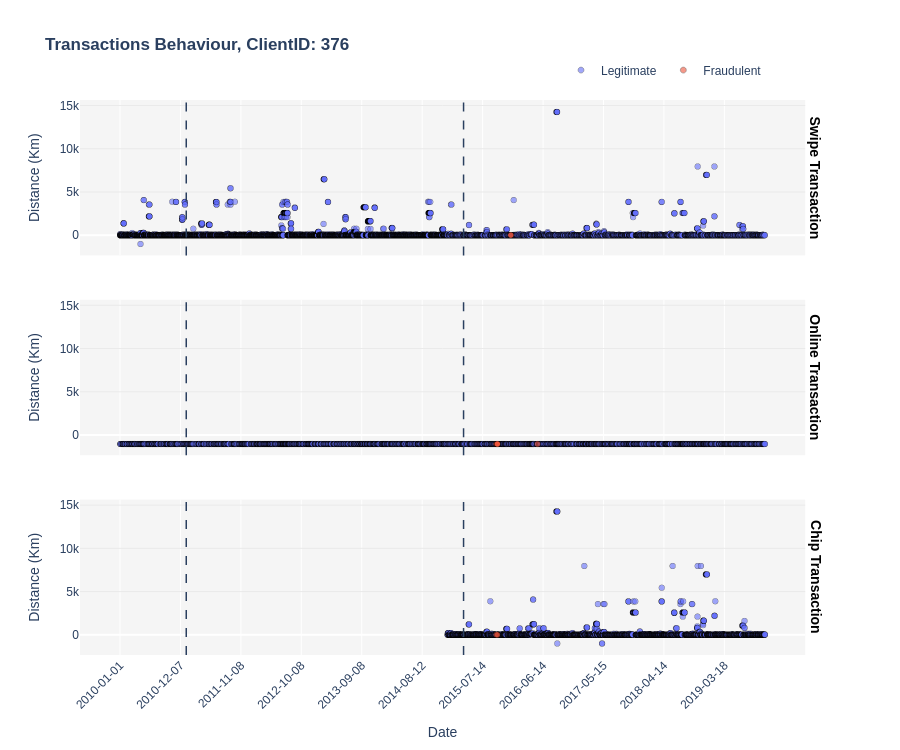

In [134]:
plot_client_behaviour_spatial("376")

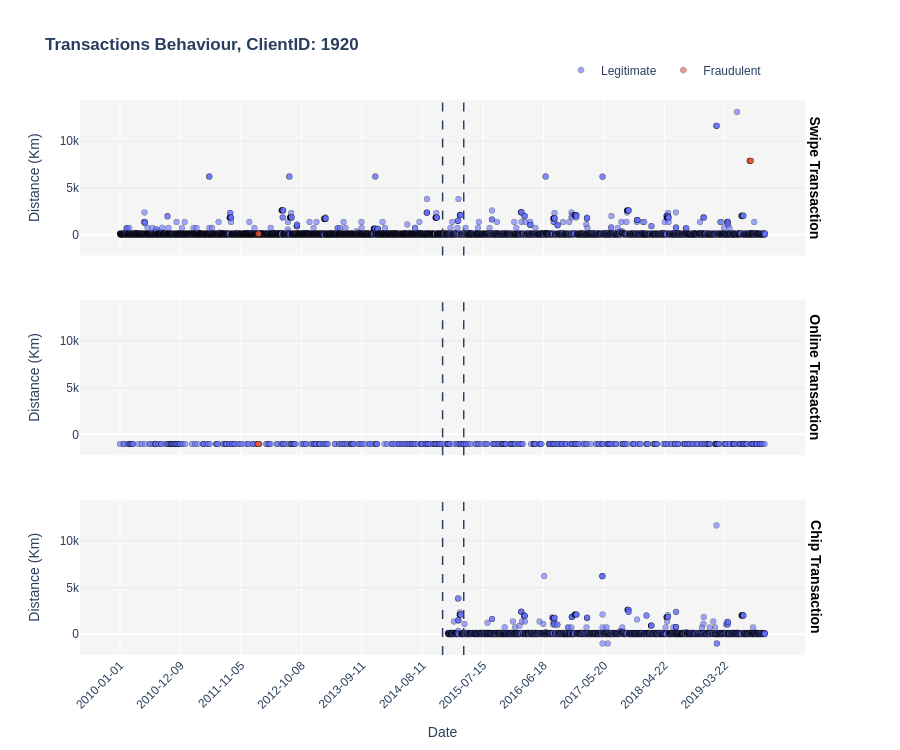

In [135]:
plot_client_behaviour_spatial(fraudulent_client_list[1])

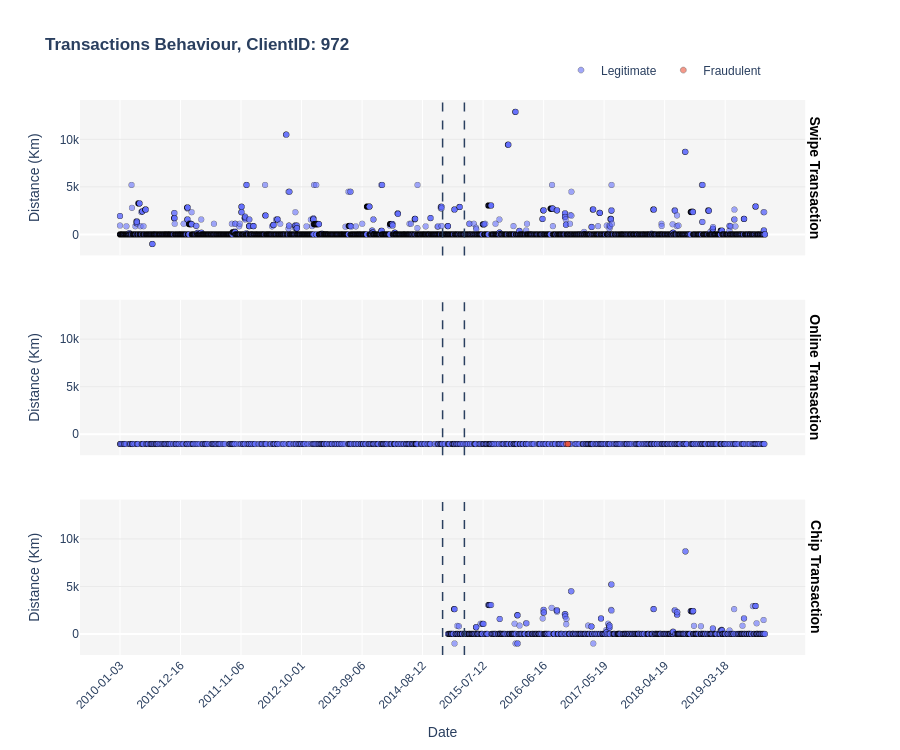

In [136]:
plot_client_behaviour_spatial(fraudulent_client_list[2])